In [1]:
import pandas as pd
import numpy as np
D = pd.read_csv("fatal-police-shootings-data.csv")
#D[D['state']=='CA']['race'].value_counts()

In [2]:
D['armed'].value_counts()

gun                3342
knife               858
unarmed             373
toy weapon          194
undetermined        173
                   ... 
machete and gun       1
flagpole              1
walking stick         1
bottle                1
nail gun              1
Name: armed, Length: 95, dtype: int64

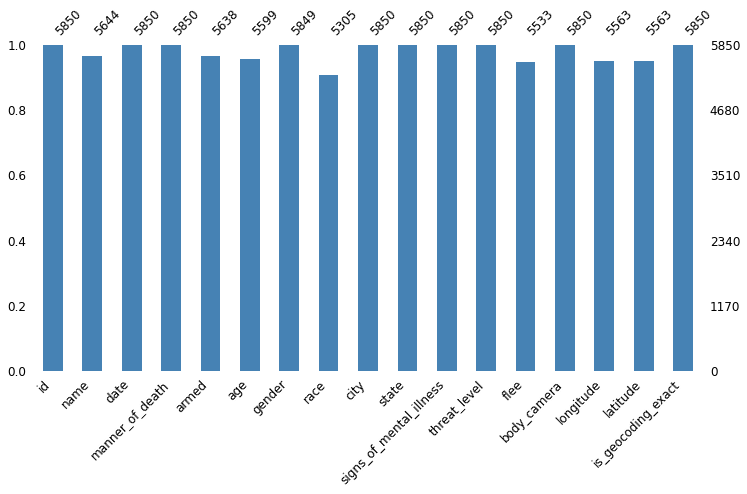

In [3]:
import missingno as msno
import matplotlib.pyplot as plt
msno.bar(D, figsize=(12, 6), fontsize=12, color='steelblue')

In [4]:
D.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5850 entries, 0 to 5849
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       5850 non-null   int64  
 1   name                     5644 non-null   object 
 2   date                     5850 non-null   object 
 3   manner_of_death          5850 non-null   object 
 4   armed                    5638 non-null   object 
 5   age                      5599 non-null   float64
 6   gender                   5849 non-null   object 
 7   race                     5305 non-null   object 
 8   city                     5850 non-null   object 
 9   state                    5850 non-null   object 
 10  signs_of_mental_illness  5850 non-null   bool   
 11  threat_level             5850 non-null   object 
 12  flee                     5533 non-null   object 
 13  body_camera              5850 non-null   bool   
 14  longitude               

In [4]:
#D_new = D[D['longitude'].notna()]
#D_new = D[D['race'].notna()]
D_new = D.dropna()

In [41]:
D_new = D_new[['armed','age','gender','race','city','state','signs_of_mental_illness','threat_level','flee','body_camera']]

In [42]:
D_new['armed'].value_counts()

gun                  2665
knife                 680
unarmed               341
toy weapon            169
vehicle               140
                     ... 
walking stick           1
incendiary device       1
air pistol              1
stapler                 1
metal hand tool         1
Name: armed, Length: 92, dtype: int64

In [43]:
D_new['armed'][D_new['armed']!='gun']='not gun'
D_new.to_csv('Data.csv')
D_new.to_excel('Data.xlsx')

In [13]:
for city in D_new['city']:
    print(city)

Shelton
Aloha
Wichita
San Francisco
Evans
Guthrie
Chandler
Assaria
Burlington
Knoxville
Stockton
Freeport
Columbus
Des Moines
New Orleans
Salt Lake City
Strong
Syracuse
England
El Paso
Arcola
South Gate
North Las Vegas
Albuquerque
Jourdanton
Chesapeake
Old Bridge
Lake Jackson
Draper
Indianapolis
Aurora
Bloomington
Fairfield
Evangeline Parish
Mabank
Fremont
Muskogee
Los Angeles
Fort Worth
Maricopa
Gunlock
Weymouth
Hemet
Chapeno
St. Louis
Derry
Sierra Blanca
Longview
Levelland
Austin
Rexburg
Baltimore
Fort Worth
Pueblo
Denver
New Hope
Tahoka
Wasco
Omaha
Morenci
Columbus
Sunset
Rosenberg
Stockton
Wyoming
Stillwater
Billings
Houston
Randallstown
Apple Valley
Bay City
Hummelstown
St. Louis
Emeryville
Antioch
Douglas
Tallahassee
Orlando
Tempe
Tempe
Lorena
Memphis
Chino
Oklahoma City
Calimesa
Gastonia
Anchorage
Austin
New City
Orange County
Nocona
Smyrna
Dallas
Whitehaven
New Castle
Pasco
San Jose
Dadeville
Kansas City
Reading
McLemoresville
San Manuel
Essex
Laredo
Iuka
Colton
Miami Gardens
M

Milwaukee
Creston
Olustee
Wasilla
Ceres
Los Angeles
Phoenix
Bakersfield
Atlanta
Philadelphia
Gonic
Los Lunas
Columbus
Enoree
Cincinnati
Montgomery County
Manchester Township
Alamosa
Blacksburg
Phoenix
Phoenix
Redding
Tarboro
Redlands
Washington Court House
Houston
Beverly Hills
Pasadena
Floral City
Fairview
Sedalia
Arlington
Cheney
Covington
Westminster
Hollywood
Morris
Jonesville
Sacramento
Citronelle
Missouri City
Buffalo
Gary
Detroit
Cumming
Mesa
Ankeny
Jacksonville
Lancaster
Manitowoc
Shreveport
Temple Hills
Maspeth
Christian County
Virginia Beach
Marysville
Honolulu
Miami
Henderson
Baltimore
Williamsburg
East Los Angeles
Peoria
Orlando
Stanfordville
Newark
Enid
Las Cruces
Hammond
Palatka
Honolulu
Johns Island
Okmulgee
Epping
Greenback
Hastings
Orlando
Mableton
Victorville
Bartlett
Nashville
Klamath Falls
Auburn
Lawtey
Clovis
Okarche
Oak Ridge
Portland
El Paso
Rochester
Sullivan
Las Vegas
Milwaukee
Fort Smith
Puna
Chandler
Orem
Woodville
Jeffersonville
Hall County
Longview
Memphis


Chicago
San Ysidro
Sylvester
Philadelphia
Alexandria
Las Vegas
Tucson
Bakersfield
Hazel Dell
Salem
El Paso
Chattanooga
Seymour
Los Angeles
Lynn
Winchester
San Antonio
Jefferson County
New Port Richey
Fort Carson
Sacramento
Jacksonville
Kent
Detroit
Tulsa
Ventura
Crestview
Rialto
Lilburn
Village of Oak Creek
Kingston Springs
Baltimore
Lanham
New Lyme Township
Oklahoma City
Winchester
Cocoa
Gillette
Stillwater County
Pensacola
Dania Beach
Batesville
La Vergne
Jacksonville
Tyler
Omaha
Los Lunas
New Smyrna Beach
Spokane Valley
Deming
Culpeper
Houma


In [8]:
D_new.iloc[:,14:16]

,longitude,latitude
0,-123.122,47.247
1,-122.892,45.487
2,-97.281,37.695
3,-122.422,37.763
4,-104.692,40.384
...,...,...
5740,-122.663,45.672
5741,-106.575,31.864
5747,-70.963,42.460
5753,-90.152,40.405


In [9]:
D_new.iloc[:,3:16].to_csv('WP_police_shooting.csv')

# Chi-squre test

# threat level VS race

In [15]:
D_new['threat_level'].value_counts()
D_new['threat_level'][D_new['threat_level']!='undetermined']

0       attack
1       attack
2        other
3       attack
4       attack
         ...  
5834    attack
5838    attack
5840    attack
5842     other
5846    attack
Name: threat_level, Length: 4355, dtype: object

In [16]:

import scipy.stats as stats
from scipy.stats import chi2_contingency
data_crosstab = pd.crosstab(D_new['threat_level'][D_new['threat_level']!='undetermined'], 
                            D_new['race'],  
                               margins = True) 
data_crosstab.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White", "row_totals"]
data_crosstab.index = ["attack", "other","col_totals"]
observed = data_crosstab.iloc[0:2, 0:6]
data_crosstab

,Asian,Black,Hispanic,Native American,Other,White,row_totals
attack,46,817,492,41,29,1563,2988
other,31,333,300,25,13,665,1367
col_totals,77,1150,792,66,42,2228,4355


In [17]:
expected =  np.outer(data_crosstab["row_totals"][0:2],
                     data_crosstab.loc["col_totals"][0:6]) / 4355
expected = pd.DataFrame(expected)
expected.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White"]
expected.index = ["attack", "other"]
expected

,Asian,Black,Hispanic,Native American,Other,White
attack,52.83031,789.02411,543.397474,45.283123,28.816533,1528.64845
other,24.16969,360.97589,248.602526,20.716877,13.183467,699.35155


In [18]:
chi_squared_stat = (((observed-expected)**2)/expected).sum().sum()
print(chi_squared_stat)

25.214654201368223


In [9]:
import scipy.stats as stats
from scipy.stats import chi2_contingency
data_crosstab = pd.crosstab(D_new['body_camera'], 
                            D_new['race'],  
                               margins = True) 
data_crosstab.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White", "row_totals"]
data_crosstab.index = ["No BodCam", "Bodcam", "col_totals"]
observed = data_crosstab.iloc[0:2, 0:6]
data_crosstab

,Asian,Black,Hispanic,Native American,Other,White,row_totals
No BodCam,63,993,717,56,38,2053,3920
Bodcam,14,211,112,12,4,245,598
col_totals,77,1204,829,68,42,2298,4518


# body_camera VS race

Contigency table

In [19]:
D_new['body_camera'].value_counts()

False    3920
True      598
Name: body_camera, dtype: int64

In [20]:
import scipy.stats as stats
from scipy.stats import chi2_contingency
data_crosstab = pd.crosstab(D_new['body_camera'], 
                            D_new['race'],  
                               margins = True) 
data_crosstab.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White", "row_totals"]
data_crosstab.index = ["No BodCam", "Bodcam", "col_totals"]
observed = data_crosstab.iloc[0:2, 0:6]
data_crosstab

,Asian,Black,Hispanic,Native American,Other,White,row_totals
No BodCam,63,993,717,56,38,2053,3920
Bodcam,14,211,112,12,4,245,598
col_totals,77,1204,829,68,42,2298,4518


In [21]:
expected =  np.outer(data_crosstab["row_totals"][0:2],
                     data_crosstab.loc["col_totals"][0:6]) / 4518
expected = pd.DataFrame(expected)
expected.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White"]
expected.index = ["No BodCam", "Bodcam"]
expected

,Asian,Black,Hispanic,Native American,Other,White
No BodCam,66.808322,1044.639221,719.274015,58.999557,36.440903,1993.837981
Bodcam,10.191678,159.360779,109.725985,9.000443,5.559097,304.162019


Expected table

In [23]:
chi_squared_stat = (((observed-expected)**2)/expected).sum().sum()
print(chi_squared_stat)

35.89938158186345


In [24]:
crit = stats.chi2.ppf(q=0.95, df=5)
print(crit)

11.070497693516351


41.65581280426747 > 11.070497693516351 (chi-square > critical value) 
there is a difference in the racial proportions of victims when body cameras were being worn 
by the officers involved at 0.05 statisitcally significant level.

# manner_of_death VS race

In [25]:
D_new['manner_of_death'].value_counts()

shot                4275
shot and Tasered     243
Name: manner_of_death, dtype: int64

In [26]:
import scipy.stats as stats
from scipy.stats import chi2_contingency
data_crosstab = pd.crosstab(D_new['manner_of_death'], 
                            D_new['race'],  
                               margins = True) 
data_crosstab.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White", "row_totals"]
data_crosstab.index = ["shot", "shot and Tasered", "col_totals"]
observed = data_crosstab.iloc[0:2, 0:6]
data_crosstab

,Asian,Black,Hispanic,Native American,Other,White,row_totals
shot,69,1134,782,67,38,2185,4275
shot and Tasered,8,70,47,1,4,113,243
col_totals,77,1204,829,68,42,2298,4518


In [27]:
expected =  np.outer(data_crosstab["row_totals"][0:2],
                     data_crosstab.loc["col_totals"][0:6]) / 4518
expected = pd.DataFrame(expected)
expected.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White"]
expected.index = ["shot", "shot and Tasered"]
expected

,Asian,Black,Hispanic,Native American,Other,White
shot,72.858566,1139.243028,784.412351,64.342629,39.741036,2174.40239
shot and Tasered,4.141434,64.756972,44.587649,3.657371,2.258964,123.59761


In [28]:
chi_squared_stat = (((observed-expected)**2)/expected).sum().sum()
print(chi_squared_stat)

8.804922777175497


In [29]:
crit = stats.chi2.ppf(q=0.95, df=5)
print(crit)

11.070497693516351


7.826714946678461 < 11.070497693516351 (chi-square < critical value) 
racial proportions of victims and manner_of_death are independent at 0.05 statisitcally significant level

# signs_of_mental_illness VS race

In [30]:
D_new['signs_of_mental_illness'].value_counts()

False    3405
True     1113
Name: signs_of_mental_illness, dtype: int64

In [31]:
import scipy.stats as stats
from scipy.stats import chi2_contingency
data_crosstab = pd.crosstab(D_new['signs_of_mental_illness'], 
                            D_new['race'],  
                               margins = True) 
data_crosstab.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White", "row_totals"]
data_crosstab.index = ["Without mental illness", "With mental illness", "col_totals"]
observed = data_crosstab.iloc[0:2, 0:6]
data_crosstab

,Asian,Black,Hispanic,Native American,Other,White,row_totals
Without mental illness,56,1007,670,54,32,1586,3405
With mental illness,21,197,159,14,10,712,1113
col_totals,77,1204,829,68,42,2298,4518


In [32]:
expected =  np.outer(data_crosstab["row_totals"][0:2],
                     data_crosstab.loc["col_totals"][0:6]) / 4392
expected = pd.DataFrame(expected)
expected.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White"]
expected.index = ["Without mental illness", "With mental illness"]
expected

,Asian,Black,Hispanic,Native American,Other,White
Without mental illness,59.696038,933.428962,642.701503,52.718579,32.561475,1781.577869
With mental illness,19.512978,305.112022,210.081284,17.232240,10.643443,582.348361


In [33]:
chi_squared_stat = (((observed-expected)**2)/expected).sum().sum()
print(chi_squared_stat)

109.04995432043823


In [32]:
crit = stats.chi2.ppf(q=0.95, df=5)
print(crit)

11.070497693516351


118.0618517737531 >> 11.070497693516351 (chi-square > critical value) 
there is a difference in the racial proportions of victims when the victim has mental illness at 0.05 statisitcally significant level.


# armed VS. race

In [34]:
D_new['armed'][D_new['armed']!='gun']='not gun'

<ipython-input-34-a4d97727e306>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  D_new['armed'][D_new['armed']!='gun']='not gun'
/Users/fanyangxin/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:8765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


In [35]:
import scipy.stats as stats
from scipy.stats import chi2_contingency
data_crosstab = pd.crosstab(D_new['armed'], 
                            D_new['race'],  
                               margins = True) 
data_crosstab.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White", "row_totals"]
data_crosstab.index = ["Gun", "Not gun", "col_totals"]
observed = data_crosstab.iloc[0:2, 0:6]
data_crosstab

,Asian,Black,Hispanic,Native American,Other,White,row_totals
Gun,31,732,432,36,18,1416,2665
Not gun,46,472,397,32,24,882,1853
col_totals,77,1204,829,68,42,2298,4518


In [36]:
expected =  np.outer(data_crosstab["row_totals"][0:2],
                     data_crosstab.loc["col_totals"][0:6]) / 4518
expected = pd.DataFrame(expected)
expected.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White"]
expected.index = ["Gun", "Not gun"]
expected

,Asian,Black,Hispanic,Native American,Other,White
Gun,45.419433,710.194776,488.996237,40.110668,24.774236,1355.504648
Not gun,31.580567,493.805224,340.003763,27.889332,17.225764,942.495352


In [37]:
chi_squared_stat = (((observed-expected)**2)/expected).sum().sum()
print(chi_squared_stat)

41.11818023804489


# gender VS race

In [38]:
D_new['gender'].value_counts()

M    4290
F     228
Name: gender, dtype: int64

In [39]:
import scipy.stats as stats
from scipy.stats import chi2_contingency
data_crosstab = pd.crosstab(D_new['gender'], 
                            D_new['race'],  
                               margins = True) 
data_crosstab.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White", "row_totals"]
data_crosstab.index = ["Female", "Male", "col_totals"]
observed = data_crosstab.iloc[0:2, 0:6]
data_crosstab

,Asian,Black,Hispanic,Native American,Other,White,row_totals
Female,3,45,27,5,3,145,228
Male,74,1159,802,63,39,2153,4290
col_totals,77,1204,829,68,42,2298,4518


In [40]:
expected =  np.outer(data_crosstab["row_totals"][0:2],
                     data_crosstab.loc["col_totals"][0:6]) / 4518
expected = pd.DataFrame(expected)
expected.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White"]
expected.index = ["Female", "Male"]
expected

,Asian,Black,Hispanic,Native American,Other,White
Female,3.88579,60.759628,41.835325,3.431607,2.119522,115.968127
Male,73.11421,1143.240372,787.164675,64.568393,39.880478,2182.031873


In [41]:
chi_squared_stat = (((observed-expected)**2)/expected).sum().sum()
print(chi_squared_stat)

18.852296853996187


17.600280503158977 > 11.070497693516351 (chi-square > critical value) 
there is a difference in the racial proportions of victims when victim is female or male at 0.05 statisitcally significant level.

# Flee VS. Race

In [42]:
D_new['flee'].value_counts()

Not fleeing    3036
Foot            664
Car             662
Other           156
Name: flee, dtype: int64

In [43]:
import scipy.stats as stats
from scipy.stats import chi2_contingency
data_crosstab = pd.crosstab(D_new['flee'], 
                            D_new['race'],  
                               margins = True) 
data_crosstab.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White", "row_totals"]
data_crosstab.index = ["Not fleeing", "Foot", "Car", "Other","col_totals"]
observed = data_crosstab.iloc[0:4, 0:6]
data_crosstab

,Asian,Black,Hispanic,Native American,Other,White,row_totals
Not fleeing,3,181,125,8,7,338,662
Foot,11,253,128,15,5,252,664
Car,63,725,538,44,28,1638,3036
Other,0,45,38,1,2,70,156
col_totals,77,1204,829,68,42,2298,4518


In [44]:
expected =  np.outer(data_crosstab["row_totals"][0:4],
                     data_crosstab.loc["col_totals"][0:6]) / 4518
expected = pd.DataFrame(expected)
expected.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White"]
expected.index = ["Not fleeing", "Foot", "Car", "Other"]
expected

,Asian,Black,Hispanic,Native American,Other,White
Not fleeing,11.282426,176.416113,121.469234,9.963701,6.154050,336.714475
Foot,11.316512,176.949093,121.836211,9.993803,6.172643,337.731740
Car,51.742364,809.062417,557.070385,45.694555,28.223108,1544.207171
Other,2.658699,41.572377,28.624170,2.347942,1.450199,79.346614


In [45]:
chi_squared_stat = (((observed-expected)**2)/expected).sum().sum()
print(chi_squared_stat)

90.00322645352438


# is_geocoding_exact VS. race

In [93]:
D_new['is_geocoding_exact'].value_counts()

True     4511
False       7
Name: is_geocoding_exact, dtype: int64

In [94]:
import scipy.stats as stats
from scipy.stats import chi2_contingency
data_crosstab = pd.crosstab(D_new['is_geocoding_exact'], 
                            D_new['race'],  
                               margins = True) 
data_crosstab.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White", "row_totals"]
data_crosstab.index = ["True","False","col_totals"]
observed = data_crosstab.iloc[0:2, 0:6]
data_crosstab

,Asian,Black,Hispanic,Native American,Other,White,row_totals
True,0,1,1,1,0,4,7
False,77,1203,828,67,42,2294,4511
col_totals,77,1204,829,68,42,2298,4518


In [96]:
expected =  np.outer(data_crosstab["row_totals"][0:2],
                     data_crosstab.loc["col_totals"][0:6]) / 4518
expected = pd.DataFrame(expected)
expected.columns = ["Asian", "Black", "Hispanic", "Native American", "Other", "White"]
expected.index = ["True","False"]
expected

,Asian,Black,Hispanic,Native American,Other,White
True,0.119301,1.865427,1.284418,0.105356,0.065073,3.560425
False,76.880699,1202.134573,827.715582,67.894644,41.934927,2294.439575


In [97]:
chi_squared_stat = (((observed-expected)**2)/expected).sum().sum()
print(chi_squared_stat)

8.3129550174346


Chi-squre test

1.threat level VS race: 30.06143347451529 > 11.07... (chi > critical value) threat level and race not independent

2. body_camera VS race: 41.65581280426747 > 11.070497693516351 (chi-square > critical value) 
there is a difference in the racial proportions of victims when body cameras were being worn by 
the officers involved at 0.05 statistically significant level.

3. manner_of_death VS race: 7.826714946678461 < 11.070497693516351 (chi-square < critical value) 
racial proportions of victims and manner_of_death are independent at 0.05 statistically significant level.

4. signs_of_mental_illness VS race: 118.0618517737531 >> 11.070497693516351 (chi-square > critical value) 
there is a difference in the racial proportions of victims when the victim has mental illness at 0.05 statistically significant level.

5. gender VS race: 17.600280503158977 > 11.070497693516351 (chi-square > critical value) 
there is a difference in the racial proportions of victims when victim is female or male at 0.05 statistically significant level.



# Heat Map

In [7]:
df = D_new.iloc[:,14:16]

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5563 entries, 0 to 5849
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   longitude  5563 non-null   float64
 1   latitude   5563 non-null   float64
dtypes: float64(2)
memory usage: 130.4 KB


In [32]:
BBox = ((-118.6020, -118.0854,      
         33.9115, 34.3338))

In [33]:
BBox = ((-124.894, -113.829,      
         32.247, 42.407))

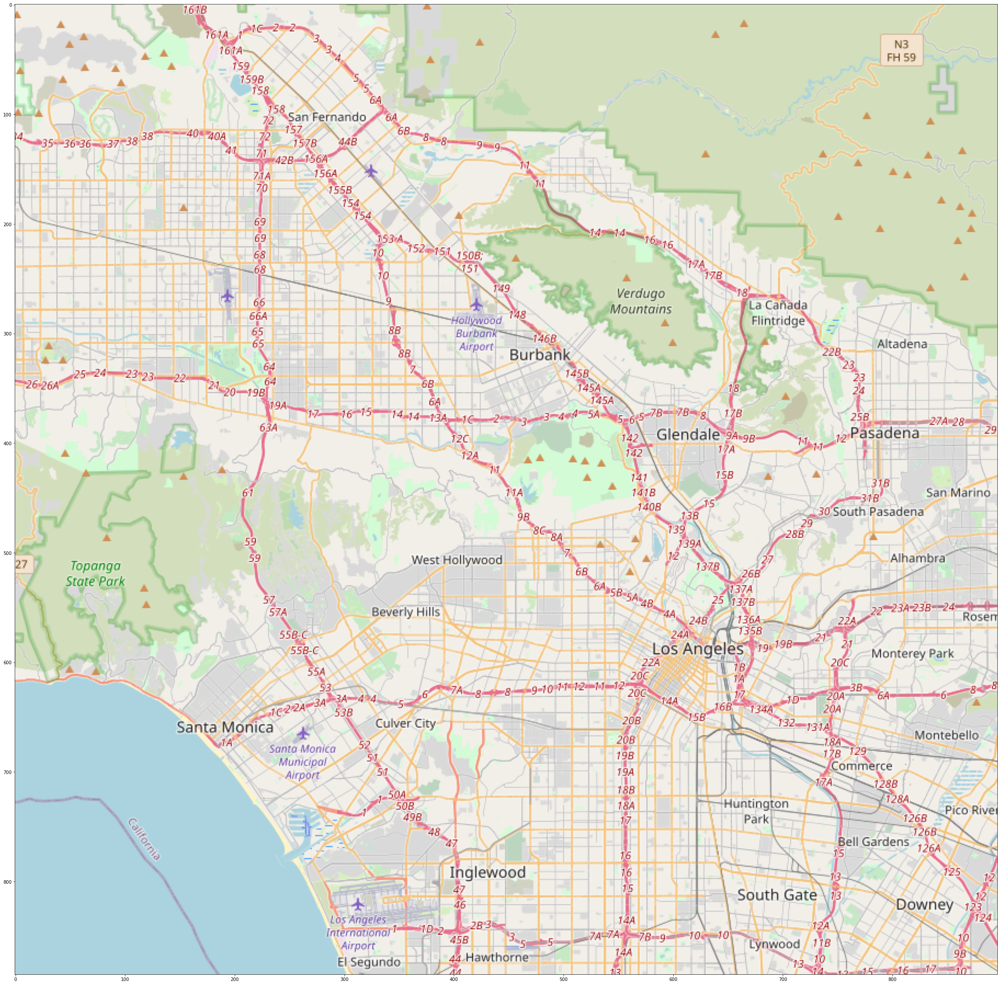

In [34]:
img = plt.imread('Los.png')
fig, ax = plt.subplots(figsize = (60,40))
ax.imshow(img)

In [35]:
(124.894-113.829) / (-32.247+42.407)

1.0890748031496078

In [36]:
724/625

1.1584

In [37]:
img.shape

(885, 896, 4)

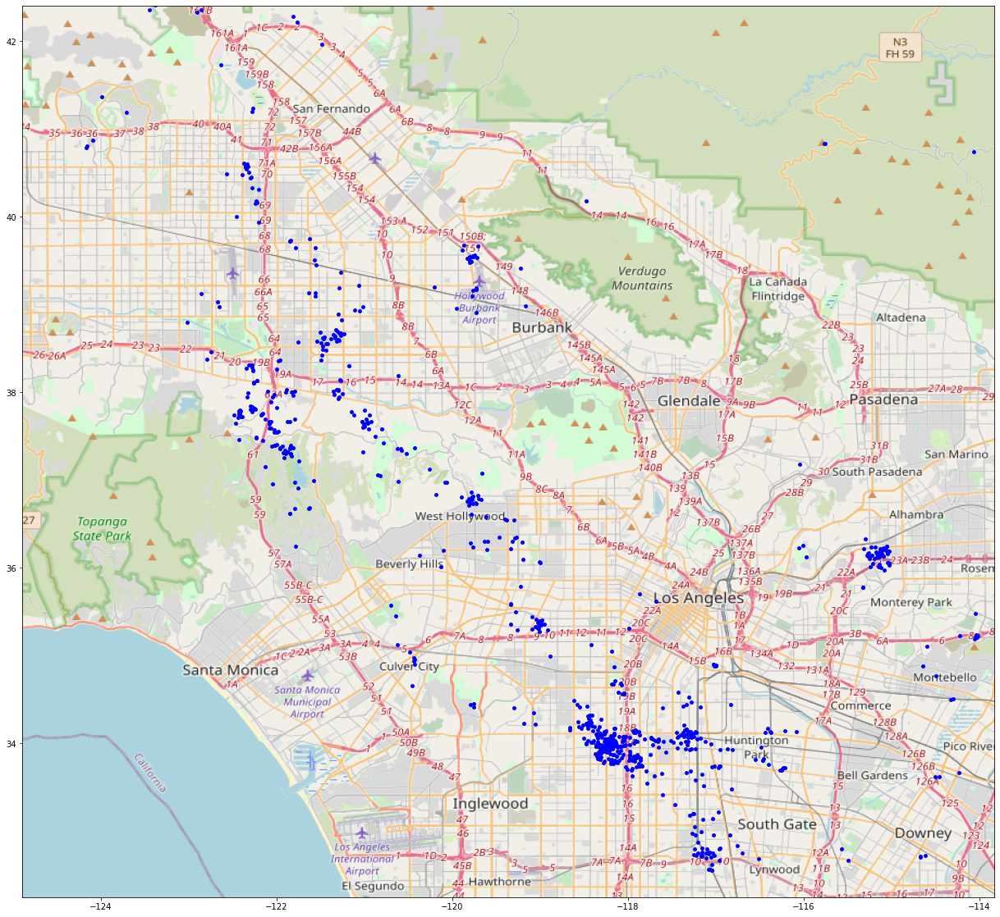

In [38]:
import matplotlib.pyplot as plt

img = plt.imread('Los.png')
fig, ax = plt.subplots(figsize = (40,20))
ax.scatter(df.longitude, df.latitude, zorder=1, alpha= 1, c='b', s=15)
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(img, zorder=0, extent = BBox, aspect= 'equal')

# Shooting location cluster (K-means)

In [10]:
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)
clean_dataset(df)

NameError: name 'df' is not defined

In [11]:
ks = range(1, 10)
inertias = []
from sklearn.cluster import KMeans
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(df)
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('Number of Clusters, k')
plt.ylabel('Within-Cluster-Sum-of-Squares (WCSS)')
plt.title('The Elbow Method Graph')
plt.xticks(ks)
plt.show()

NameError: name 'df' is not defined

In [10]:
import json
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
with open('uswtdb_v1_1_20180710.geojson') as f:
data = json.load(f)
coordinates = [feature['geometry']['coordinates'] for feature in data['features']]
coordinates = np.array(coordinates)
coordinates = [feature['geometry']['coordinates'] for feature in data['features']]
coordinates = np.array(coordinates)

IndentationError: expected an indented block (<ipython-input-10-cf0712e1d1a7>, line 7)

[[ -97.21110295   35.31866353]
 [-118.87622501   37.87682286]
 [ -81.55677425   36.68591562]]


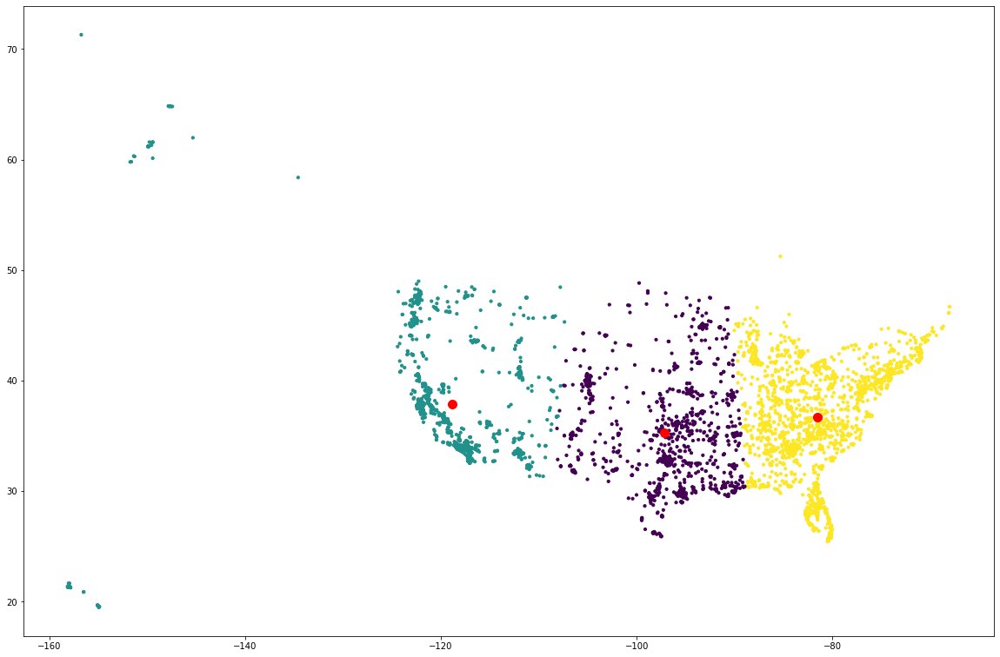

In [43]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3).fit(df)
centroids = kmeans.cluster_centers_
print(centroids)

plt.subplots(figsize = (20,40/3))
plt.scatter(df['longitude'], df['latitude'], c= kmeans.labels_.astype(float), s=10, alpha=10)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=100)
plt.show()

In [38]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# cluster the data into five clusters
dbscan = DBSCAN(eps=0.5, min_samples = 50).fit(df)
labels = dbscan.labels_

import plotly.graph_objects as go


fig = go.Figure(data=go.Scattergeo(
        lon = df['longitude'],
        lat = df['latitude'],
        marker_color = labels+2,
        marker_size=2.5
        ))

fig.update_layout(
        title = 'DBSCAN Clustering of Fatal Police Shooting Location',
        geo_scope='usa'
    )
    
fig.show()




In [36]:
import seaborn as sns
from sklearn.cluster import OPTICS
clustering = OPTICS(min_samples=50).fit(df)
labels = clustering.labels_


import plotly.graph_objects as go


fig = go.Figure(data=go.Scattergeo(
        lon = df['longitude'],
        lat = df['latitude'],
        marker_color = labels,
        ))

fig.update_layout(
        title = '',
        geo_scope='usa',
    )
fig.show()


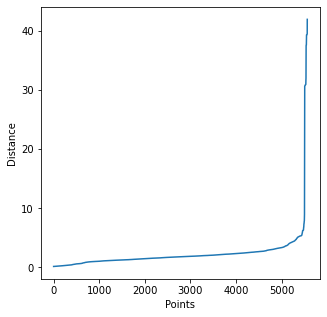

In [20]:
from sklearn.neighbors import NearestNeighbors
nearest_neighbors = NearestNeighbors(n_neighbors=121)
neighbors = nearest_neighbors.fit(df)
distances, indices = neighbors.kneighbors(df)
distances = np.sort(distances[:,120], axis=0)
fig = plt.figure(figsize=(5, 5))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("Distance")
plt.savefig("Distance_curve.png", dpi=300)

3.371584345674897


<Figure size 360x360 with 0 Axes>

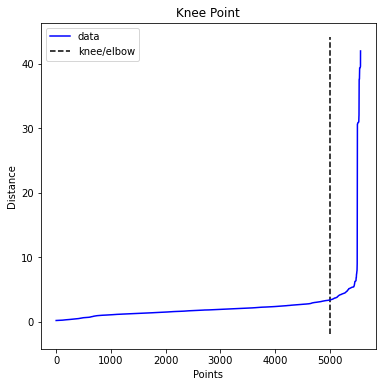

In [21]:
from kneed import KneeLocator
i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')
fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")

print(distances[knee.knee])

# K-mode Clustering for categorical attributes in WP Dataset

In [69]:
from kmodes.kmodes import KModes

D_cluster = D_new.dropna()
D_cluster['age_bin']=pd.cut(x=D_cluster['age'], bins=[0,12,20,40,59,100], 
                        labels=["Child", "Adolescence", "Adult","Middle_Age","Old"])
Da = D_cluster
Da.drop(['age','longitude','latitude'], axis=1, inplace = True)
D_cl = Da.iloc[:,3:15]

<ipython-input-69-d4995a7c71d4>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  D_cluster['age_bin']=pd.cut(x=D_cluster['age'], bins=[0,12,20,40,59,100],
/Users/fanyangxin/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3990: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [42]:
km_cao = KModes(n_clusters=4, init = "Cao", n_init = 2, verbose=1)
fitClusters_cao = km_cao.fit_predict(D_cl)

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 660, cost: 16679.0
Run 1, iteration: 2/100, moves: 309, cost: 16679.0


In [43]:
len(fitClusters_cao)

4392

In [44]:
clusterCentroidsDf = pd.DataFrame(km_cao.cluster_centroids_)
clusterCentroidsDf.columns = D_cl.columns
clusterCentroidsDf

,manner_of_death,armed,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,is_geocoding_exact,age_bin
0,shot,gun,M,W,Los Angeles,CA,False,attack,Not fleeing,False,True,Adult
1,shot,knife,M,W,Las Vegas,CA,True,other,Not fleeing,False,True,Middle_Age
2,shot,unarmed,M,B,Baltimore,TX,False,other,Not fleeing,True,True,Adult
3,shot,gun,M,B,Houston,TX,False,attack,Car,False,True,Middle_Age


Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 18873.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 298, cost: 17882.0
Run 1, iteration: 2/100, moves: 0, cost: 17882.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 296, cost: 17435.0
Run 1, iteration: 2/100, moves: 275, cost: 17258.0
Run 1, iteration: 3/100, moves: 161, cost: 17251.0
Run 1, iteration: 4/100, moves: 1, cost: 17251.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 660, cost: 16679.0
Run 1, iteration: 2/100, moves: 309, cost: 16679.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 472, cost: 16568.0
Run 1, iteration: 2/100, moves: 294, cost: 16568.0
Init: initializing centroids
Init: initializi

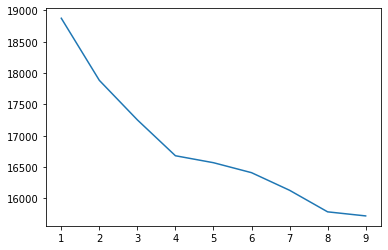

In [45]:
cost = []
for num_clusters in list(range(1,10)):
    kmode = KModes(n_clusters=num_clusters, init = "Cao", n_init = 1, verbose=1)
    kmode.fit_predict(D_cl)
    cost.append(kmode.cost_)
    
y = np.array([i for i in range(1,10,1)])
plt.plot(y,cost)

In [46]:
D = D_cl.copy()
D = D.reset_index()
clustersDf = pd.DataFrame(fitClusters_cao)
clustersDf.columns = ['cluster_predicted']
combinedDf = pd.concat([D, clustersDf], axis = 1).reset_index(drop=True)
combinedDf

,index,manner_of_death,armed,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,is_geocoding_exact,age_bin,cluster_predicted
0,0,shot,gun,M,A,Shelton,WA,True,attack,Not fleeing,False,True,Middle_Age,0
1,1,shot,gun,M,W,Aloha,OR,False,attack,Not fleeing,False,True,Middle_Age,0
2,2,shot and Tasered,unarmed,M,H,Wichita,KS,False,other,Not fleeing,False,True,Adult,2
3,3,shot,toy weapon,M,W,San Francisco,CA,True,attack,Not fleeing,False,True,Adult,0
4,4,shot,nail gun,M,H,Evans,CO,False,attack,Not fleeing,False,True,Adult,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4387,5739,shot,gun,M,H,Tucson,AZ,False,attack,Foot,False,True,Adult,0
4388,5740,shot,gun,M,B,Hazel Dell,WA,False,other,Foot,False,True,Adult,0
4389,5741,shot,undetermined,M,W,El Paso,TX,False,other,Car,False,True,Middle_Age,3
4390,5747,shot,vehicle,M,W,Lynn,MA,False,attack,Car,False,True,Adult,0


In [47]:
combinedDf.drop(['index'], axis = 1,inplace = True)
combinedDf

,manner_of_death,armed,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,is_geocoding_exact,age_bin,cluster_predicted
0,shot,gun,M,A,Shelton,WA,True,attack,Not fleeing,False,True,Middle_Age,0
1,shot,gun,M,W,Aloha,OR,False,attack,Not fleeing,False,True,Middle_Age,0
2,shot and Tasered,unarmed,M,H,Wichita,KS,False,other,Not fleeing,False,True,Adult,2
3,shot,toy weapon,M,W,San Francisco,CA,True,attack,Not fleeing,False,True,Adult,0
4,shot,nail gun,M,H,Evans,CO,False,attack,Not fleeing,False,True,Adult,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4387,shot,gun,M,H,Tucson,AZ,False,attack,Foot,False,True,Adult,0
4388,shot,gun,M,B,Hazel Dell,WA,False,other,Foot,False,True,Adult,0
4389,shot,undetermined,M,W,El Paso,TX,False,other,Car,False,True,Middle_Age,3
4390,shot,vehicle,M,W,Lynn,MA,False,attack,Car,False,True,Adult,0


In [48]:
cluster_1 = combinedDf[combinedDf['cluster_predicted'] == 0]
cluster_2 = combinedDf[combinedDf['cluster_predicted'] == 1]
cluster_3 = combinedDf[combinedDf['cluster_predicted'] == 2]
cluster_4 = combinedDf[combinedDf['cluster_predicted'] == 3]

In [49]:
cluster_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3071 entries, 0 to 4391
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   manner_of_death          3071 non-null   object  
 1   armed                    3071 non-null   object  
 2   gender                   3071 non-null   object  
 3   race                     3071 non-null   object  
 4   city                     3071 non-null   object  
 5   state                    3071 non-null   object  
 6   signs_of_mental_illness  3071 non-null   bool    
 7   threat_level             3071 non-null   object  
 8   flee                     3071 non-null   object  
 9   body_camera              3071 non-null   bool    
 10  is_geocoding_exact       3071 non-null   bool    
 11  age_bin                  3071 non-null   category
 12  cluster_predicted        3071 non-null   uint16  
dtypes: bool(3), category(1), object(8), uint16(1)
memory usage: 234

In [50]:
cluster_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 565 entries, 12 to 4376
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   manner_of_death          565 non-null    object  
 1   armed                    565 non-null    object  
 2   gender                   565 non-null    object  
 3   race                     565 non-null    object  
 4   city                     565 non-null    object  
 5   state                    565 non-null    object  
 6   signs_of_mental_illness  565 non-null    bool    
 7   threat_level             565 non-null    object  
 8   flee                     565 non-null    object  
 9   body_camera              565 non-null    bool    
 10  is_geocoding_exact       565 non-null    bool    
 11  age_bin                  565 non-null    category
 12  cluster_predicted        565 non-null    uint16  
dtypes: bool(3), category(1), object(8), uint16(1)
memory usage: 43.

In [51]:
cluster_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 295 entries, 2 to 4386
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   manner_of_death          295 non-null    object  
 1   armed                    295 non-null    object  
 2   gender                   295 non-null    object  
 3   race                     295 non-null    object  
 4   city                     295 non-null    object  
 5   state                    295 non-null    object  
 6   signs_of_mental_illness  295 non-null    bool    
 7   threat_level             295 non-null    object  
 8   flee                     295 non-null    object  
 9   body_camera              295 non-null    bool    
 10  is_geocoding_exact       295 non-null    bool    
 11  age_bin                  295 non-null    category
 12  cluster_predicted        295 non-null    uint16  
dtypes: bool(3), category(1), object(8), uint16(1)
memory usage: 22.7

In [52]:
cluster_4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 461 entries, 9 to 4389
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   manner_of_death          461 non-null    object  
 1   armed                    461 non-null    object  
 2   gender                   461 non-null    object  
 3   race                     461 non-null    object  
 4   city                     461 non-null    object  
 5   state                    461 non-null    object  
 6   signs_of_mental_illness  461 non-null    bool    
 7   threat_level             461 non-null    object  
 8   flee                     461 non-null    object  
 9   body_camera              461 non-null    bool    
 10  is_geocoding_exact       461 non-null    bool    
 11  age_bin                  461 non-null    category
 12  cluster_predicted        461 non-null    uint16  
dtypes: bool(3), category(1), object(8), uint16(1)
memory usage: 35.3

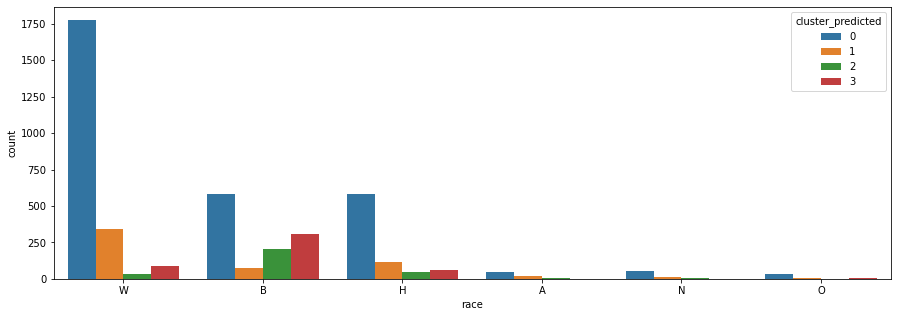

In [53]:
import seaborn as sns
plt.subplots(figsize = (15,5))
sns.countplot(x=combinedDf['race'],order=combinedDf['race'].value_counts().index,hue=combinedDf['cluster_predicted'])
plt.show()

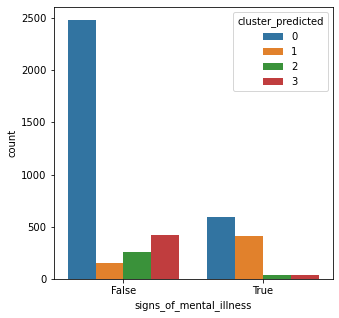

In [54]:
plt.subplots(figsize = (5,5))
sns.countplot(x=combinedDf['signs_of_mental_illness'],order=combinedDf['signs_of_mental_illness'].value_counts().index,hue=combinedDf['cluster_predicted'])
plt.show()

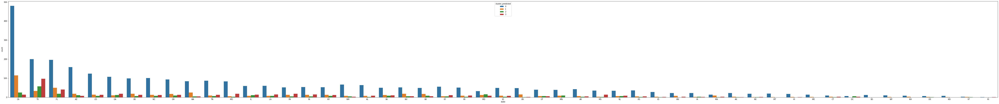

In [55]:
plt.subplots(figsize = (100,10))
sns.countplot(x=combinedDf['state'],order=combinedDf['state'].value_counts().index,hue=combinedDf['cluster_predicted'])
plt.show()

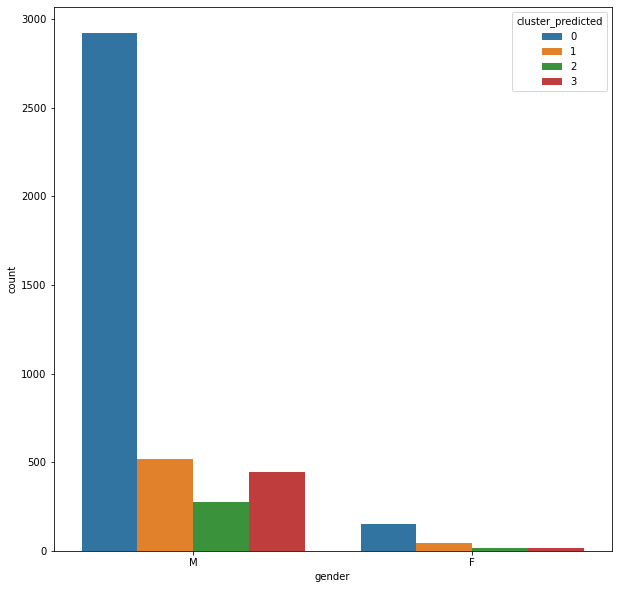

In [56]:
plt.subplots(figsize = (10,10))
sns.countplot(x=combinedDf['gender'],order=combinedDf['gender'].value_counts().index,hue=combinedDf['cluster_predicted'])
plt.show()

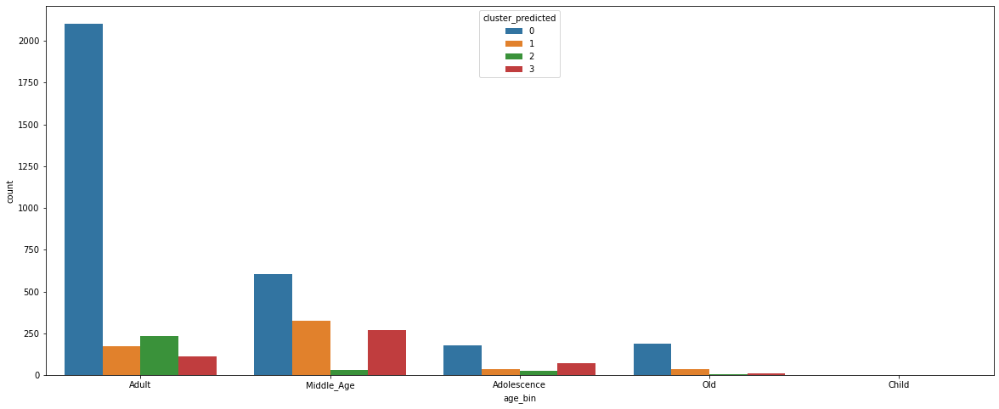

In [57]:
plt.subplots(figsize = (20,8))
sns.countplot(x=combinedDf['age_bin'],order=combinedDf['age_bin'].value_counts().index,hue=combinedDf['cluster_predicted'])
plt.show()

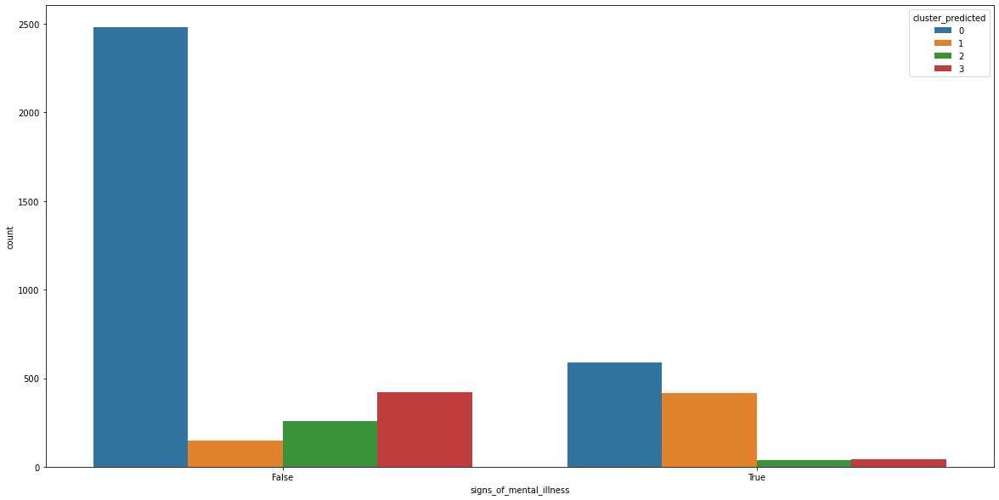

In [58]:
plt.subplots(figsize = (20,10))
sns.countplot(x=combinedDf['signs_of_mental_illness'],order=combinedDf['signs_of_mental_illness'].value_counts().index,hue=combinedDf['cluster_predicted'])
plt.show()

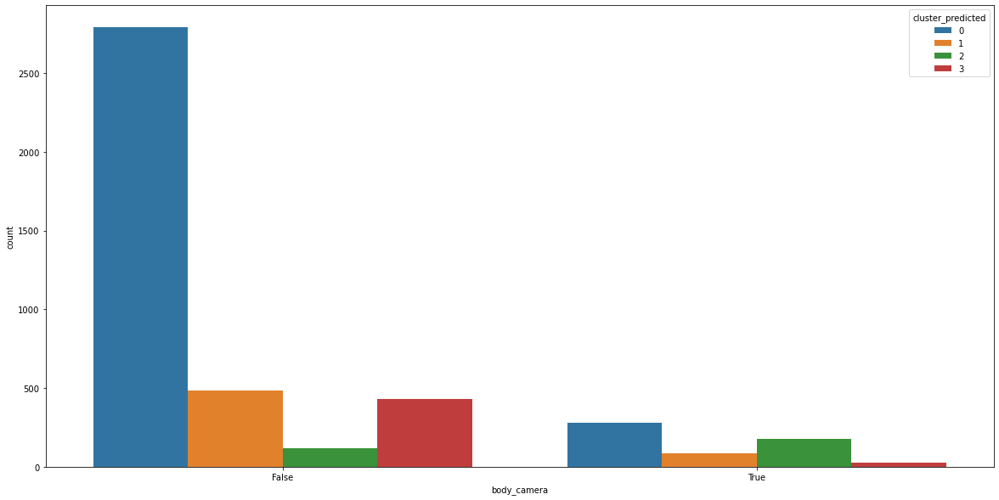

In [59]:
plt.subplots(figsize = (20,10))
sns.countplot(x=combinedDf['body_camera'],order=combinedDf['body_camera'].value_counts().index,hue=combinedDf['cluster_predicted'])
plt.show()

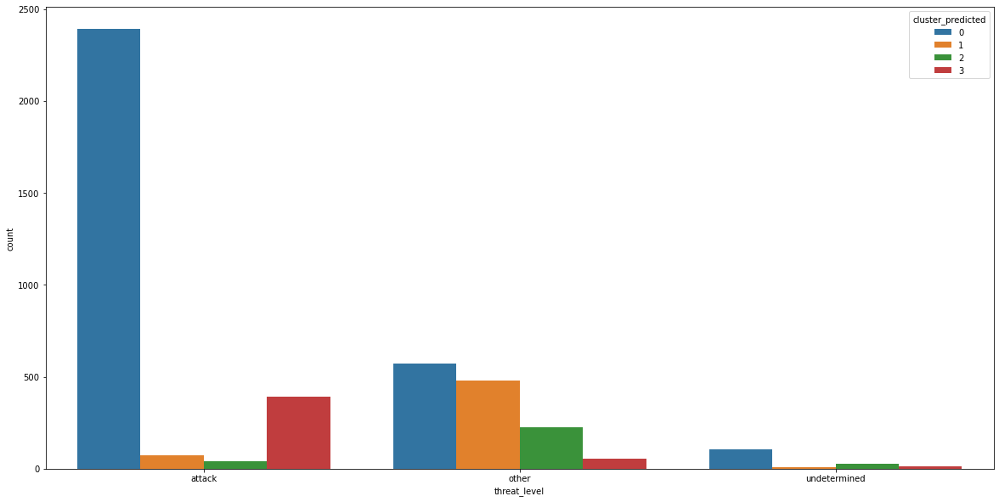

In [60]:
plt.subplots(figsize = (20,10))
sns.countplot(x=combinedDf['threat_level'],order=combinedDf['threat_level'].value_counts().index,hue=combinedDf['cluster_predicted'])
plt.show()

# Correlation Heatmap

In [70]:
D_ohe = D_cl
D_ohe.drop(['city','armed','state'], axis=1, inplace = True)
D_ohe

,manner_of_death,gender,race,signs_of_mental_illness,threat_level,flee,body_camera,is_geocoding_exact,age_bin
0,shot,M,A,True,attack,Not fleeing,False,True,Middle_Age
1,shot,M,W,False,attack,Not fleeing,False,True,Middle_Age
2,shot and Tasered,M,H,False,other,Not fleeing,False,True,Adult
3,shot,M,W,True,attack,Not fleeing,False,True,Adult
4,shot,M,H,False,attack,Not fleeing,False,True,Adult
...,...,...,...,...,...,...,...,...,...
5739,shot,M,H,False,attack,Foot,False,True,Adult
5740,shot,M,B,False,other,Foot,False,True,Adult
5741,shot,M,W,False,other,Car,False,True,Middle_Age
5747,shot,M,W,False,attack,Car,False,True,Adult


In [71]:
from sklearn.preprocessing import OneHotEncoder

D_ohe = pd.get_dummies(D_ohe)
D_ohe

,signs_of_mental_illness,body_camera,is_geocoding_exact,manner_of_death_shot,manner_of_death_shot and Tasered,gender_F,gender_M,race_A,race_B,race_H,...,threat_level_undetermined,flee_Car,flee_Foot,flee_Not fleeing,flee_Other,age_bin_Child,age_bin_Adolescence,age_bin_Adult,age_bin_Middle_Age,age_bin_Old
0,True,False,True,1,0,0,1,1,0,0,...,0,0,0,1,0,0,0,0,1,0
1,False,False,True,1,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,0
2,False,False,True,0,1,0,1,0,0,1,...,0,0,0,1,0,0,0,1,0,0
3,True,False,True,1,0,0,1,0,0,0,...,0,0,0,1,0,0,0,1,0,0
4,False,False,True,1,0,0,1,0,0,1,...,0,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5739,False,False,True,1,0,0,1,0,0,1,...,0,0,1,0,0,0,0,1,0,0
5740,False,False,True,1,0,0,1,0,1,0,...,0,0,1,0,0,0,0,1,0,0
5741,False,False,True,1,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,1,0
5747,False,False,True,1,0,0,1,0,0,0,...,0,1,0,0,0,0,0,1,0,0


In [72]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
D_after = D_ohe.apply(le.fit_transform)
D_after.head()

,signs_of_mental_illness,body_camera,is_geocoding_exact,manner_of_death_shot,manner_of_death_shot and Tasered,gender_F,gender_M,race_A,race_B,race_H,...,threat_level_undetermined,flee_Car,flee_Foot,flee_Not fleeing,flee_Other,age_bin_Child,age_bin_Adolescence,age_bin_Adult,age_bin_Middle_Age,age_bin_Old
0,1,0,1,1,0,0,1,1,0,0,...,0,0,0,1,0,0,0,0,1,0
1,0,0,1,1,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,0
2,0,0,1,0,1,0,1,0,0,1,...,0,0,0,1,0,0,0,1,0,0
3,1,0,1,1,0,0,1,0,0,0,...,0,0,0,1,0,0,0,1,0,0
4,0,0,1,1,0,0,1,0,0,1,...,0,0,0,1,0,0,0,1,0,0


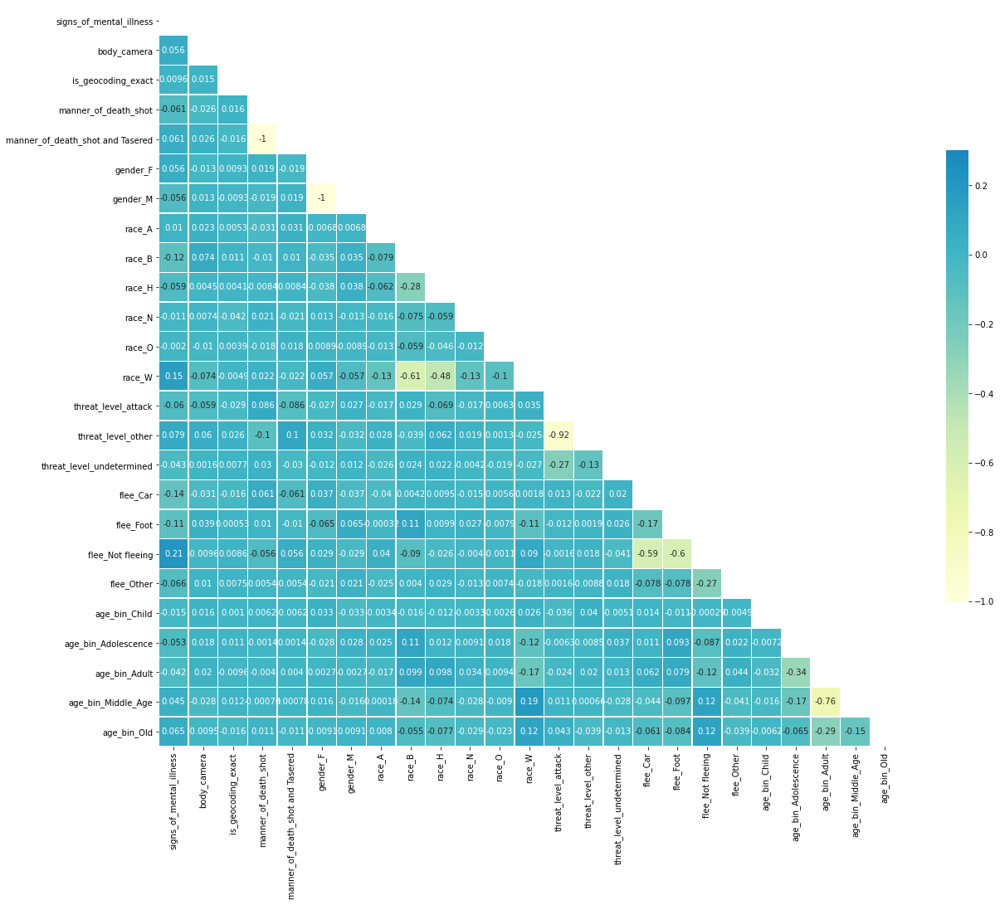

In [76]:
corr = D_after.corr(method='spearman')
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr,annot=True, mask=mask, cmap="YlGnBu", vmax=.30, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

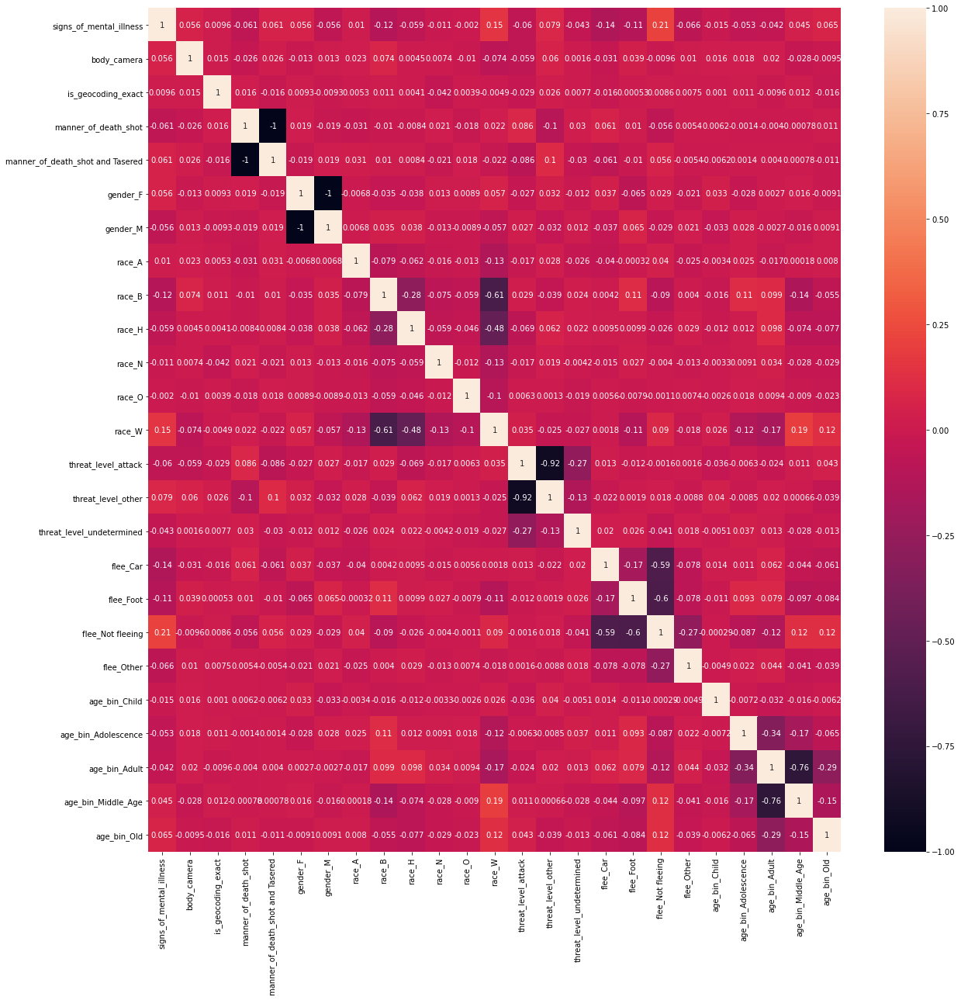

In [75]:
corrMatrix = D_after.corr()
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corrMatrix, annot=True)
plt.show()

In [79]:
import scipy.stats as ss
def cramers_v(confusion_matrix):
    """ calculate Cramers V statistic for categorial-categorial association.
        uses correction from Bergsma and Wicher,
        Journal of the Korean Statistical Society 42 (2013): 323-328
    """
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

In [86]:
confusion_matrix = pd.crosstab(D_cl["gender"], D_cl["race"]).to_numpy()
cramers_v(confusion_matrix)

0.053148321513894724